In [1]:
import numpy as np
import pandas as pd
from scipy.spatial import distance_matrix

import os
import glob
from natsort import natsorted

import ipywidgets as widgets
import matplotlib.pyplot as plt
from matplotlib.legend_handler import HandlerTuple
from ipywidgets import interact


plt.rcParams.update({
"text.usetex": False,
"font.family": ["sans-serif"],
"font.sans-serif": ["Computer Modern Sans Serif"]})


In [2]:
params = pd.read_csv("data/params_file.csv")

def get_loc(i):
    if os.path.isfile(f'../LowSwitch/ID-{i}_time-500_From2ParamSweep_Data.csv'):
        return '../LowSwitch'
    if os.path.isfile(f'../HighSwitch/ID-{i}_time-500_From2ParamSweep_Data.csv'):
        return '../HighSwitch'
    return 'data'

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Computer Modern Sans Serif


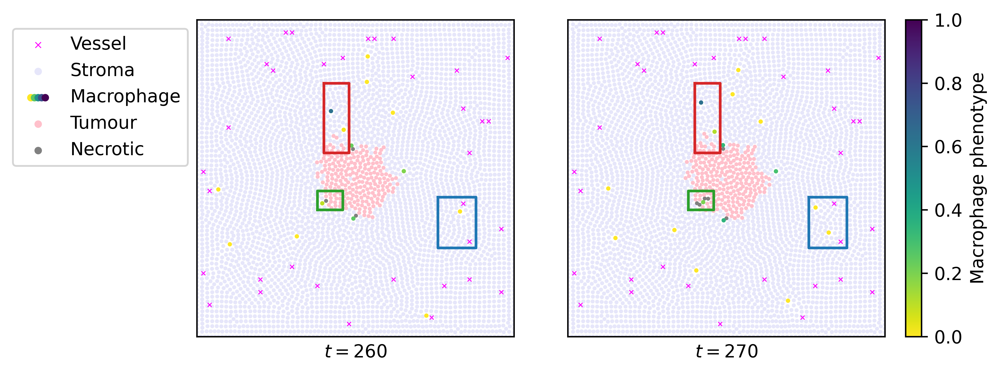

In [3]:
# ID-401, t=26 and t=27
i = 401
ID = f'{get_loc(i)}/ID-{i}_time-*_From2ParamSweep_Data.csv'

MPs = []
vessels = []
tumours = []
stromas = []
necrotics = []

for f in natsorted(glob.glob(ID)):
    df = pd.read_csv(f)
    mp = df[df.celltypes == 'Macrophage'][['points_x', 'points_y', 'phenotypes']].to_numpy()
    vessel = df[df.celltypes == 'Vessel'][['points_x', 'points_y']].to_numpy()
    tumour = df[df.celltypes == 'Tumour'][['points_x', 'points_y']].to_numpy()
    stroma = df[df.celltypes == 'Stroma'][['points_x', 'points_y']].to_numpy()
    necrotic = df[df.celltypes == 'Necrotic'][['points_x', 'points_y']].to_numpy()

    MPs.append(mp)
    tumours.append(tumour)
    vessels.append(vessel)
    stromas.append(stroma)
    necrotics.append(necrotic)

assert len(MPs) > 0

plt.figure(figsize=(8,3), dpi=600)

ax = plt.subplot(1,2,1, aspect='equal')
t=26
plt.xlabel(f'$t={t*10}$')
# Boxes
plt.plot([20,24,24,20,20], [40,40,29,29,40], c='tab:red')
plt.plot([19,23,23,19,19], [20,20,23,23,20], c='tab:green')
plt.plot([38,44,44,38,38], [22,22,14,14,22], c='tab:blue')
# Cells
st = ax.scatter(stromas[t][:,0], stromas[t][:,1], c='lavender', s=1.5, label='Stroma')
ne = ax.scatter(necrotics[t][:,0], necrotics[t][:,1], c='gray', s=1.5, label='Necrotic')
tu = ax.scatter(tumours[t][:,0], tumours[t][:,1], c='pink', s=1.5, label='Tumour')
ma = ax.scatter(MPs[t][:,0], MPs[t][:,1], c=MPs[t][:,2], cmap='viridis_r', vmin=0, vmax=1, s=2, )
ve = ax.scatter(vessels[t][:,0], vessels[t][:,1], c='magenta', marker='x', linewidth=.5, s=5, label='Vessel')
macrophage_handles = []
for c in np.linspace(0,1, 5):
    m = ax.scatter([100],[0], c=[c], s=10, cmap='viridis_r', vmin=0, vmax=1,)
    macrophage_handles.append(m)
plt.xticks([]); plt.yticks([])
plt.xlim(0, 50); plt.ylim(0, 50)
# Legend on the left
legend = ax.legend(
    [ve, st, tuple(macrophage_handles), tu, ne, ],
    ["Vessel", "Stroma", "Macrophage", "Tumour", "Necrotic"],
    bbox_to_anchor=(0, 1),
    handler_map={tuple: HandlerTuple(ndivide=None, pad=-1)},
    # numpoints=10,
)
for handle in legend.legendHandles: 
    if handle is not None:
        handle.set_sizes([10.])

ax = plt.subplot(1,2,2, aspect='equal')
t=27
plt.xlabel(f'$t={t*10}$')
# Boxes
plt.plot([20,24,24,20,20], [40,40,29,29,40], c='tab:red')
plt.plot([19,23,23,19,19], [20,20,23,23,20], c='tab:green')
plt.plot([38,44,44,38,38], [22,22,14,14,22], c='tab:blue')
# Cells
st = ax.scatter(stromas[t][:,0], stromas[t][:,1], c='lavender', s=1.5, label='Stroma')
ne = ax.scatter(necrotics[t][:,0], necrotics[t][:,1], c='gray', s=1.5, label='Necrotic')
tu = ax.scatter(tumours[t][:,0], tumours[t][:,1], c='pink', s=1.5, label='Tumour')
ma = ax.scatter(MPs[t][:,0], MPs[t][:,1], c=MPs[t][:,2], cmap='viridis_r', vmin=0, vmax=1, s=2, )
ve = ax.scatter(vessels[t][:,0], vessels[t][:,1], c='magenta', marker='x', linewidth=.5, s=5, label='Vessel')
plt.xticks([]); plt.yticks([])
plt.xlim(0, 50); plt.ylim(0, 50)# Colorbar on the right
plt.colorbar(ma).ax.set_ylabel('Macrophage phenotype')

plt.tight_layout()


In [4]:
fig, axs = plt.subplots(3, 6, figsize=(20, 10), constrained_layout=True, dpi=600)
IDs = [281, 589, 1189]

for i, i_ in enumerate([183, 755, 1189]):
    ID = f'{get_loc(i_)}/ID-{i_}_time-*_From2ParamSweep_Data.csv'
    param = params[params.simulation_id == f"AWS_ParameterSweep_24072021/{i_}"].iloc[0]
    MPs = []
    vessels = []
    tumours = []
    stromas = []
    necrotics = []
    for f in natsorted(glob.glob(ID)):
        df = pd.read_csv(f)
        mp = df[df.celltypes == 'Macrophage'][['points_x', 'points_y', 'phenotypes']].to_numpy()
        vessel = df[df.celltypes == 'Vessel'][['points_x', 'points_y']].to_numpy()
        tumour = df[df.celltypes == 'Tumour'][['points_x', 'points_y']].to_numpy()
        stroma = df[df.celltypes == 'Stroma'][['points_x', 'points_y']].to_numpy()
        necrotic = df[df.celltypes == 'Necrotic'][['points_x', 'points_y']].to_numpy()
        MPs.append(mp)
        tumours.append(tumour)
        vessels.append(vessel)
        stromas.append(stroma)
        necrotics.append(necrotic)
    print("M2 ratio", len(mp[mp[:,2] >= .5]) / len(mp))
    assert len(MPs) > 0
# 
    for j, t in enumerate(range(25, 51, 5)):
        ax = axs[i][j]
        ax.set_xlabel(f'$t={t*10}$')
        # Cells
        st = ax.scatter(stromas[t][:,0], stromas[t][:,1], c='lavender', s=1.5, label='Stroma')
        ne = ax.scatter(necrotics[t][:,0], necrotics[t][:,1], c='gray', s=1.5, label='Necrotic')
        tu = ax.scatter(tumours[t][:,0], tumours[t][:,1], c='pink', s=1.5, label='Tumour')
        ma = ax.scatter(MPs[t][:,0], MPs[t][:,1], c=MPs[t][:,2], cmap='viridis_r', vmin=0, vmax=1, s=2, )
        ve = ax.scatter(vessels[t][:,0], vessels[t][:,1], c='magenta', marker='x', linewidth=.5, s=5, label='Vessel')
        ax.set_xticks([]); ax.set_yticks([])
        ax.set_xlim(0, 50); ax.set_ylim(0, 50)
        # Legend on the left
        if i == 0 and j == 0:
            legend = ax.legend(
            [ve, st, tuple(macrophage_handles), tu, ne, ],
            ["Vessel", "Stroma", "Macrophage", "Tumour", "Necrotic"],
            bbox_to_anchor=(-0.1, 1),
            handler_map={tuple: HandlerTuple(ndivide=None, pad=-1)},
            # numpoints=10,
        )
        for handle in legend.legendHandles: 
            if handle is not None:
                handle.set_sizes([10.])
        # Colorbar on the right
        if i == 1 and j == 5:
            ax.figure.colorbar(ma).ax.set_ylabel('Macrophage phenotype')
        # Params
        if j == 0:
            ax.set_ylabel(fr"$c_{{1/2}} = {param.halfMaximalExtravasationCsf1Conc}; \chi_c^m = {param.chi_macrophageToCSF}; g_\mathrm{{crit}} = {param.tgfThresholdForPhenotypeSwitch}$")

    

M2 ratio 0.23114355231143552
M2 ratio 0.1829787234042553


/var/folders/qs/_n_tglmn4rz7tzwynwxk4f7w0000gn/T/ipykernel_99224/3369010358.py:52: MatplotlibDeprecationWarning: Starting from Matplotlib 3.6, colorbar() will steal space from the mappable's axes, rather than from the current axes, to place the colorbar.  To silence this warning, explicitly pass the 'ax' argument to colorbar().
  ax.figure.colorbar(ma).ax.set_ylabel('Macrophage phenotype')


M2 ratio 0.6891891891891891


In [5]:
def matching(A, B):
    eyedee = { i:i for i in range(min(len(A), len(B))) }
    return eyedee, eyedee


In [6]:
i = 529
ID = f'{get_loc(i)}/ID-{i}_time-*_From2ParamSweep_Data.csv'

MPs = []
vessels = []
tumours = []
stromas = []
necrotics = []

for f in natsorted(glob.glob(ID)):
    df = pd.read_csv(f)
    mp = df[df.celltypes == 'Macrophage'][['points_x', 'points_y', 'phenotypes']].to_numpy()
    vessel = df[df.celltypes == 'Vessel'][['points_x', 'points_y']].to_numpy()
    tumour = df[df.celltypes == 'Tumour'][['points_x', 'points_y']].to_numpy()
    stroma = df[df.celltypes == 'Stroma'][['points_x', 'points_y']].to_numpy()
    necrotic = df[df.celltypes == 'Necrotic'][['points_x', 'points_y']].to_numpy()

    MPs.append(mp)
    tumours.append(tumour)
    vessels.append(vessel)
    stromas.append(stroma)
    necrotics.append(necrotic)

assert len(MPs) > 0

orbs = [ ]
orbs_prev = {
    i: { 'birth': 0, 'coords': [ MPs[0][i] ] }
    for i in range(len(MPs[0]))
}

for t in range(1, len(MPs)):
    orbs_ = {}
    As = MPs[t-1]
    Bs = MPs[t]
    A2B, B2A = matching(As, Bs)

    for j in range(len(Bs)):
        if j in B2A:
            orbs_[j] = {
                'birth': orbs_prev[B2A[j]]['birth'],
                'coords': orbs_prev[B2A[j]]['coords'] + [ Bs[j] ],
            }
        else:
            orbs_[j] = {
                'birth': t,
                'coords': [ Bs[j] ], 
            }
    orbs_prev = orbs_
    
    for i in range(len(As)):
        if i not in A2B:
            orbs.append( {
                'birth': orbs_prev[i]['birth'],
                'death': t,
                'coords': orbs_prev[i]['coords'],
            } )

for orb in orbs_prev.values():
    orbs.append({
        'birth': orb['birth'],
        'death': len(MPs),
        'coords': orb['coords'],
    })

color = plt.cm.rainbow(np.linspace(0, 1, len(orbs)))

TAIL_LENGTH = 2

def traj(t):
    cnt = 0
    plt.figure(figsize=(3,3), dpi=200)
    plt.scatter(stromas[t][:,0], stromas[t][:,1], c='lavender', s=1.5, label='Stroma')
    plt.scatter(tumours[t][:,0], tumours[t][:,1], c='pink', s=1.5, label='Tumour')

    for i, orb in enumerate(orbs):
        if orb['birth'] <= t and orb['death'] > t:
            cnt += 1
            t_end = t-orb['birth']
            t_start = max(0, t_end-TAIL_LENGTH)
            orb = np.array(orb['coords'])[t_start:t_end+1]
            plt.plot(
                orb[:, 0], 
                orb[:, 1], 
                '-',
                c=color[i],
            )
            plt.scatter(orb[-1,0], orb[-1,1], c=orb[-1,2], cmap='viridis_r', vmin=0, vmax=1, marker='x', s=3)
    
    plt.scatter(necrotics[t][:,0], necrotics[t][:,1], c='gray', s=1.5, label='Necrotic')
    plt.scatter(vessels[t][:,0], vessels[t][:,1], c='magenta', marker='x', linewidth=.5, s=5, zorder=11, label='Vessel')
    
    plt.xlim(0, 50); plt.ylim(0, 50)
    plt.xticks([]); plt.yticks([])
    # plt.legend()

    plt.show()
    
    # D = distance_matrix(vessels[t], tumours[t])
    # D[D == 0] = np.inf
    # return sorted(D.min(axis=1))
    return f"Nb of tumours & macrophages: {len(tumours[t])}, {cnt}"
    # mp = MPs[t]
    # return len(mp[mp[:,2] < .5]) / len(mp)

interact(traj, t=(0,50,1));


interactive(children=(IntSlider(value=25, description='t', max=50), Output()), _dom_classes=('widget-interact'…